In [51]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google.colab'

In [ ]:
!pip install pm4py
!pip install plotly
!pip install ipywidgets
!pip install tabulate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 19.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for intervaltree: filename=intervaltree-3.1.0-py2.py3-none-any.whl size=26095 sha256=8bdb23a3cbe9f7501c675cc4058c673b25f2a3b58c80cc9033ed889b10865153
  Stored in directory: /root/.cache/pip/wheels/fa/80/8c/43488a924a046b733b64de3fac99252674c892a4c3801c0a61
  Created wheel for stringdist: filename=StringDist-1.0.9-cp310-cp310-linux_x86_64.whl size=16968 sha256=a4fe620a9d44c897380acd97f072190a4460557366014c06281d24625aa18034
  Stored in directory: /root/.cache/pip/wheels/79/25/0a/4a0c2c7af31a8b473f6e10e30312396f31ae899722600d7b99
Successfully built intervaltree stringdist
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 8.3 MB/s eta 0:00:00


In [ ]:
# Importer l'ensemble des librairies
import pandas as pd
import pm4py
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np
import os
from typing import Optional
from pm4py.objects.ocel.importer.csv import importer as csv_importer
from pm4py.objects.ocel.importer.jsonocel import importer as jsonocel_importer
from pm4py.objects.ocel.importer.xmlocel import importer as xmlocel_importer
from pm4py.objects.ocel.importer.sqlite import importer as sqlite_importer
from pm4py.objects.ocel.obj import OCEL
from pm4py.util import constants
import csv
import ipywidgets as widgets
from IPython.display import display
from sklearn.preprocessing import LabelEncoder
from ipywidgets import interact, widgets
import plotly.express as px

 importer différents format .xes, json, etc. Ajouter également lapossiblité de transformer un fichier .csv en .xes
aussi les files de OCEL

In [ ]:
def read(file_path: str, objects_path: Optional[str] = None, encoding: str = 'utf-8'):
    """
    Reads an object-centric event log from a file (see: http://www.ocel-standard.org/).
    The ``OCEL`` object is returned by this method.

    :param file_path: file path of the event log
    :param objects_path: [Optional] file path from which the objects dataframe should be read
    :param encoding: the encoding to be used (default: utf-8)
    :rtype: ``OCEL``
    """

    if not os.path.exists(file_path):
        raise Exception("File does not exist")

    # Vérifiez les en-têtes spécifiques pour déterminer le type de fichier CSV
    is_ocel_csv = check_for_ocel_headers(file_path)

    if is_ocel_csv:
        return read_ocel_csv(file_path, objects_path, encoding=encoding)
    elif file_path.lower().endswith(".jsonocel"):
        return read_ocel_json(file_path, encoding=encoding)
    elif file_path.lower().endswith(".xmlocel"):
        return read_ocel_xml(file_path, encoding=encoding)
    elif file_path.lower().endswith(".sqlite"):
        return read_ocel_sqlite(file_path, encoding=encoding)
    else:
        # Si le fichier n'est pas un fichier OCEL, lisez-le comme un fichier CSV, JSON ou XLSX normal
        if file_path.lower().endswith(".csv"):
            return read_csv(file_path)
        elif file_path.lower().endswith(".json"):
            return pd.read_json(file_path)
        elif file_path.lower().endswith((".xls", ".xlsx")):
            return pd.read_excel(file_path)
        elif file_path.endswith('.xes'):
        # Traitement des fichiers XES avec pm4py
            return pm4py.read_xes(file_path)
        else:
            raise Exception("Unsupported file format")
def read_csv(file_path: str) -> pd.DataFrame:
    """
    Reads a CSV file using pandas, checking specifically for comma or semicolon separators.

    :param file_path: file path of the CSV file
    :rtype: pd.DataFrame
    """
    # Utilisez le sniffer de pandas pour détecter automatiquement le séparateur
    try:
        # Essayez d'ouvrir le fichier en mode texte pour éviter d'éventuels problèmes d'encodage
        with open(file_path, 'r', encoding='utf-8') as f:
            first_line = f.readline()
            if ';' in first_line:
              separator=';'
            elif ',' in first_line:
              separator=','
    except Exception as e:
        print(f"Erreur lors de la détection automatique du séparateur : {e}")
        separator = ','  # Utilisez la virgule par défaut si la détection échoue

    # Lisez le fichier CSV avec le séparateur détecté
    df = pd.read_csv(file_path, sep=separator)

    return df


def check_for_ocel_headers(file_path: str) -> bool:
    """
    Checks if the given file has headers indicative of an OCEL CSV file.

    :param file_path: file path of the file
    :rtype: bool
    """
    # Spécifiez ici les en-têtes spécifiques que vous attendez dans un fichier CSV OCEL
    expected_headers = ["ocel_version"]

    # Vérifiez si le fichier est un fichier Excel
    if file_path.lower().endswith((".xls", ".xlsx")):
        try:
            # Essayez de lire le fichier Excel avec pandas
            excel_data = pd.read_excel(file_path)
            # Vérifiez la présence de tous les en-têtes attendus dans les colonnes du DataFrame Excel
            return all(header in excel_data.columns for header in expected_headers)
        except pd.errors.ParserError:
            # Le fichier n'est pas un fichier Excel valide
            return False
    else:
        # Le fichier n'est pas un fichier Excel, traitons-le comme un fichier CSV
        # Lisez les en-têtes du fichier CSV
        with open(file_path, 'r') as csv_file:
            reader = csv.reader(csv_file)
            headers = next(reader, [])

        # Vérifiez la présence de tous les en-têtes attendus
        return all(header in headers for header in expected_headers)

def read_ocel_csv(file_path: str, objects_path: Optional[str] = None, encoding: str = constants.DEFAULT_ENCODING) -> OCEL:
    """
    Reads an object-centric event log from a CSV file (see: http://www.ocel-standard.org/).
    The ``OCEL`` object is returned by this method

    :param file_path: file path of the object-centric event log (.csv)
    :param objects_path: [Optional] file path from which the objects dataframe should be read
    :param encoding: the encoding to be used (default: utf-8)
    :rtype: ``OCEL``

    .. code-block:: python3

        import pm4py

        ocel = pm4py.read_ocel_csv("<path_to_ocel_file.csv>")
    """
    if not os.path.exists(file_path):
        raise Exception("File does not exist")

    from pm4py.objects.ocel.importer.csv import importer as csv_importer
    return csv_importer.apply(file_path, objects_path=objects_path, parameters={"encoding": encoding})



def read_ocel_json(file_path: str, encoding: str = constants.DEFAULT_ENCODING) -> OCEL:
    """
    Reads an object-centric event log from a JSON-OCEL file (see: http://www.ocel-standard.org/).
    The ``OCEL`` object is returned by this method

    :param file_path: file path of the object-centric event log (.jsonocel)
    :param encoding: the encoding to be used (default: utf-8)
    :rtype: ``OCEL``

    .. code-block:: python3

        import pm4py

        ocel = pm4py.read_ocel_json("<path_to_ocel_file.jsonocel>")
    """
    if not os.path.exists(file_path):
        raise Exception("File does not exist")

    from pm4py.objects.ocel.importer.jsonocel import importer as jsonocel_importer
    return jsonocel_importer.apply(file_path, variant=jsonocel_importer.Variants.CLASSIC, parameters={"encoding": encoding})



def read_ocel_xml(file_path: str, encoding: str = constants.DEFAULT_ENCODING) -> OCEL:
    """
    Reads an object-centric event log from a XML-OCEL file (see: http://www.ocel-standard.org/).
    The ``OCEL`` object is returned by this method

    :param file_path: file path of the object-centric event log (.xmlocel)
    :param encoding: the encoding to be used (default: utf-8)
    :rtype: ``OCEL``

    .. code-block:: python3

        import pm4py

        ocel = pm4py.read_ocel_xml("<path_to_ocel_file.xmlocel>")
    """
    if not os.path.exists(file_path):
        raise Exception("File does not exist")

    from pm4py.objects.ocel.importer.xmlocel import importer as xmlocel_importer
    return xmlocel_importer.apply(file_path, variant=xmlocel_importer.Variants.CLASSIC, parameters={"encoding": encoding})



def read_ocel_sqlite(file_path: str, encoding: str = constants.DEFAULT_ENCODING) -> OCEL:
    """
    Reads an object-centric event log from a SQLite database (see: http://www.ocel-standard.org/).
    The ``OCEL`` object is returned by this method

    :param file_path: file path of the SQLite database (.sqlite)
    :param encoding: the encoding to be used (default: utf-8)
    :rtype: ``OCEL``

    .. code-block:: python3

        import pm4py

        ocel = pm4py.read_ocel_sqlite("<path_to_ocel_file.sqlite>")
    """
    if not os.path.exists(file_path):
        raise Exception("File does not exist")
    return sqlite_importer.apply(file_path, variant=sqlite_importer.Variants.PANDAS_IMPORTER, parameters={"encoding": encoding})


In [ ]:
def choose_columns(file_path):
    # Lire le fichier CSV
    data = read(file_path)

    # Extraire les noms des colonnes
    column_names = data.columns.tolist()

    # Demander à l'utilisateur de choisir les colonnes
    print("Noms des colonnes disponibles :", column_names)
    case_id_col = input("Entrez le nom de la colonne pour Case ID: ")
    activity_col = input("Entrez le nom de la colonne pour Activity: ")
    timestamp_col = input("Entrez le nom de la colonne pour Timestamp: ")

    return case_id_col, activity_col, timestamp_col

In [ ]:
data=read('CDG_Data_Log (1).xes')
data.head()

parsing log, completed traces ::   0%|          | 0/1528 [00:00<?, ?it/s]

,NUM_DA,ACTION_CODE,USER,DATE ACTION,concept:name,time:timestamp,@@index,@@case_index,case:concept:name
0,6468,SUBMIT,Demandeur MOA,2021-01-10 10:51:01+00:00,SUBMIT,2021-01-10 10:51:01+00:00,0,0,6468
1,6468,APPROVE,Responsable hiérarchique MOA,2021-01-10 10:54:43+00:00,APPROVE,2021-01-10 10:54:43+00:00,1,0,6468
2,6468,APPROVE,Directeur MOA,2021-01-10 11:06:43+00:00,APPROVE,2021-01-10 11:06:43+00:00,2,0,6468
3,6468,APPROVE,Responsable Entité Achats,2021-01-10 11:43:35+00:00,APPROVE,2021-01-10 11:43:35+00:00,3,0,6468
4,6468,APPROVE,Responsable Unité Ordonnancement des Dépenses,2021-01-10 14:42:44+00:00,APPROVE,2021-01-10 14:42:44+00:00,4,0,6468


In [ ]:
def read_right_format(file_path):
    case_id_col, activity_col, timestamp_col = choose_columns(file_path)
    # tranformer la colonne de date en format datetime
    data[timestamp_col] = pd.to_datetime(data[timestamp_col], format='%d/%m/%y %H:%M:%S')

    data[case_id_col] = data[case_id_col].astype(str)

    log = pm4py.convert_to_dataframe(data)

    return log


In [ ]:
data["concept:name"]=data["ACTION_CODE"]+ " BY "+data["USER"]
data.head()

,NUM_DA,ACTION_CODE,USER,DATE ACTION,concept:name,time:timestamp,@@index,@@case_index,case:concept:name
0,6468,SUBMIT,Demandeur MOA,2021-01-10 10:51:01+00:00,SUBMIT BY Demandeur MOA,2021-01-10 10:51:01+00:00,0,0,6468
1,6468,APPROVE,Responsable hiérarchique MOA,2021-01-10 10:54:43+00:00,APPROVE BY Responsable hiérarchique MOA,2021-01-10 10:54:43+00:00,1,0,6468
2,6468,APPROVE,Directeur MOA,2021-01-10 11:06:43+00:00,APPROVE BY Directeur MOA,2021-01-10 11:06:43+00:00,2,0,6468
3,6468,APPROVE,Responsable Entité Achats,2021-01-10 11:43:35+00:00,APPROVE BY Responsable Entité Achats,2021-01-10 11:43:35+00:00,3,0,6468
4,6468,APPROVE,Responsable Unité Ordonnancement des Dépenses,2021-01-10 14:42:44+00:00,APPROVE BY Responsable Unité Ordonnancement de...,2021-01-10 14:42:44+00:00,4,0,6468


In [ ]:
log = read_right_format('CDG_Data_Log (1).xes')

parsing log, completed traces ::   0%|          | 0/1528 [00:00<?, ?it/s]

Noms des colonnes disponibles : ['NUM_DA', 'ACTION_CODE', 'USER', 'DATE ACTION', 'concept:name', 'time:timestamp', '@@index', '@@case_index', 'case:concept:name']


In [ ]:
dff=data[['case:concept:name','concept:name', 'time:timestamp']]
dff

,case:concept:name,concept:name,time:timestamp
0,6468,SUBMIT BY Demandeur MOA,2021-01-10 10:51:01+00:00
1,6468,APPROVE BY Responsable hiérarchique MOA,2021-01-10 10:54:43+00:00
2,6468,APPROVE BY Directeur MOA,2021-01-10 11:06:43+00:00
3,6468,APPROVE BY Responsable Entité Achats,2021-01-10 11:43:35+00:00
4,6468,APPROVE BY Responsable Unité Ordonnancement de...,2021-01-10 14:42:44+00:00
...,...,...,...
7356,8833,WITHDRAW BY Demandeur MOA,2022-10-21 15:13:04+00:00
7357,8833,SUBMIT BY Demandeur MOA,2022-10-21 15:14:23+00:00
7358,8833,APPROVE BY Directeur MOA,2022-10-21 15:47:55+00:00
7359,8833,APPROVE BY Responsable Entité Achats,2022-10-21 15:52:36+00:00


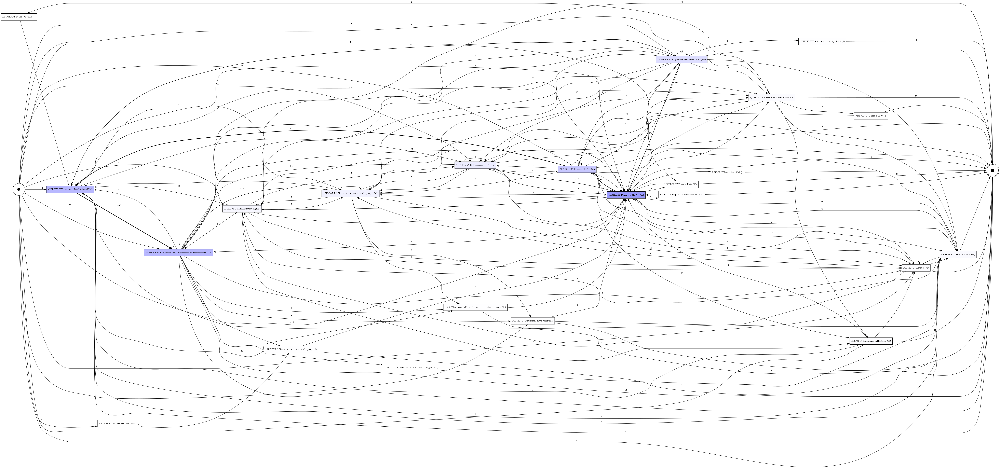

In [91]:
df,im,fm=pm4py.discover_dfg(log,activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
pm4py.view_dfg(df, im, fm)

In [ ]:
activities = pm4py.get_event_attribute_values(log, 'concept:name', case_id_key='case:concept:name')
activities

{'SUBMIT BY Demandeur MOA': 1926,
 'APPROVE BY Responsable Entité Achats': 1356,
 'APPROVE BY Responsable Unité Ordonnancement des Dépenses': 1355,
 'APPROVE BY Directeur MOA': 1055,
 'APPROVE BY Responsable hiérarchique MOA': 628,
 'WITHDRAW BY Demandeur MOA': 345,
 'APPROVE BY Directeur des Achats et de la Logistique': 245,
 'APPROVE BY Demandeur MOA': 139,
 'CANCEL BY Demandeur MOA': 96,
 'QUESTION BY Responsable Entité Achats': 69,
 'RETURN BY Acheteur': 58,
 'REJECT BY Responsable Entité Achats': 31,
 'REJECT BY Directeur MOA': 16,
 'REJECT BY Responsable Unité Ordonnancement des Dépenses': 15,
 'RETURN BY Responsable Entité Achats': 11,
 'REJECT BY Responsable hiérarchique MOA': 6,
 'REJECT BY Directeur des Achats et de la Logistique': 2,
 'CANCEL BY Responsable hiérarchique MOA': 2,
 'ANSWER BY Directeur MOA': 2,
 'ANSWER BY Demandeur MOA': 1,
 'ANSWER BY Responsable Entité Achats': 1,
 'QUESTION BY Directeur des Achats et de la Logistique': 1,
 'REJECT BY Demandeur MOA': 1}

In [ ]:
len(activities)

23

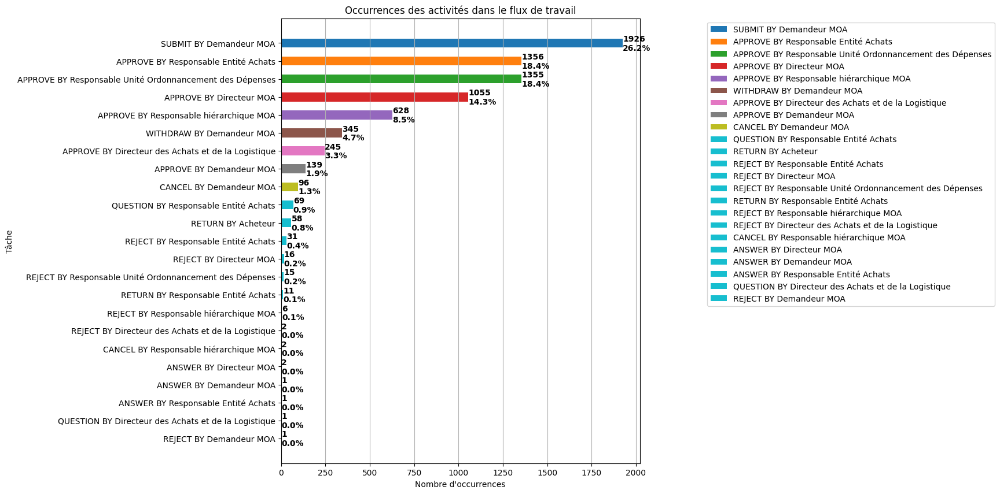

In [ ]:

#le nombre total d'activites
num_tasks = len(activities)

# Generer des couleurs uniques pour chaque activite
unique_colors = plt.cm.tab10(np.arange(num_tasks))

#creer une figure
fig, ax = plt.subplots(figsize=(8, 10))

# barres horizontales pour chaque activite
bars = ax.barh(list(activities.keys()), list(activities.values()), color=unique_colors,height=0.5)

# legende
legend_labels = [f'{task}' for task, color in zip(activities.keys(), unique_colors)]
ax.legend(bars, legend_labels, loc='upper right', bbox_to_anchor=(2, 1))

# Inverser l'axe y
ax.invert_yaxis()

#grille sur l'axe x
ax.xaxis.grid()


ax.set_xlabel('Nombre d\'occurrences')
ax.set_ylabel('Tâche')
ax.set_title('Occurrences des activités dans le flux de travail')

# des annotations pour afficher les valeurs et pourcentage sur chaque activite
for i, v in enumerate(activities.values()):
    ax.text(v, i - 0.1, str(v), color='black', fontsize=10, fontweight='bold')
    ax.text(v, i + 0.4, str(round(v/sum(activities.values())*100, 1)) + "%", color='black', fontsize=10, fontweight='bold')


plt.show()

In [ ]:
start_activities = pm4py.get_start_activities(log, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
end_activities = pm4py.get_end_activities(log, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
print(start_activities)
print(end_activities)

{'SUBMIT BY Demandeur MOA': 1352, 'APPROVE BY Responsable Entité Achats': 42, 'APPROVE BY Responsable Unité Ordonnancement des Dépenses': 33, 'APPROVE BY Directeur MOA': 23, 'WITHDRAW BY Demandeur MOA': 21, 'APPROVE BY Responsable hiérarchique MOA': 19, 'RETURN BY Acheteur': 12, 'CANCEL BY Demandeur MOA': 11, 'APPROVE BY Directeur des Achats et de la Logistique': 4, 'APPROVE BY Demandeur MOA': 3, 'QUESTION BY Responsable Entité Achats': 3, 'REJECT BY Directeur MOA': 2, 'ANSWER BY Responsable Entité Achats': 1, 'RETURN BY Responsable Entité Achats': 1, 'REJECT BY Responsable Entité Achats': 1}
{'APPROVE BY Responsable Unité Ordonnancement des Dépenses': 927, 'APPROVE BY Directeur des Achats et de la Logistique': 167, 'SUBMIT BY Demandeur MOA': 98, 'CANCEL BY Demandeur MOA': 77, 'APPROVE BY Demandeur MOA': 74, 'APPROVE BY Directeur MOA': 40, 'APPROVE BY Responsable Entité Achats': 35, 'RETURN BY Acheteur': 22, 'APPROVE BY Responsable hiérarchique MOA': 20, 'QUESTION BY Responsable Entité

In [ ]:
def plot_activity_occurrence(dataframe, title):

    activities = list(dataframe.keys())
    occurrences = list(dataframe.values())

    total_occurrences = sum(occurrences)
    percentages = [occurrence / total_occurrences * 100 for occurrence in occurrences]

    fig, ax = plt.subplots(figsize=(10, 6))

    y_pos = np.arange(len(activities))

    bars = ax.barh(y_pos, occurrences, color='blue')
    ax.set_yticks(y_pos)
    ax.set_yticklabels(activities)
    ax.invert_yaxis()  # Inverse l'ordre pour afficher le plus grand en haut

    for i, bar in enumerate(bars):
        percentage = f'{percentages[i]:.2f}%'
        ax.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, percentage,
                va='center', ha='left', color='red')

    ax.set_xlabel('Occurrences')
    ax.set_title(title)

    plt.show()

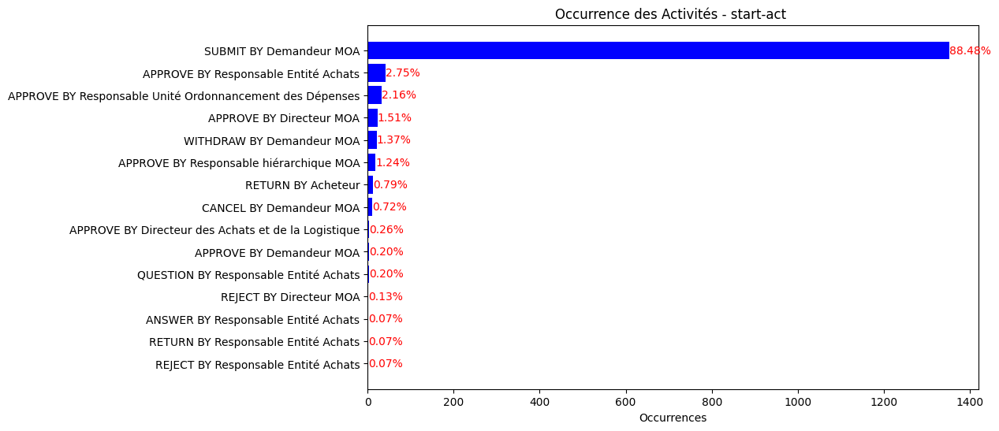

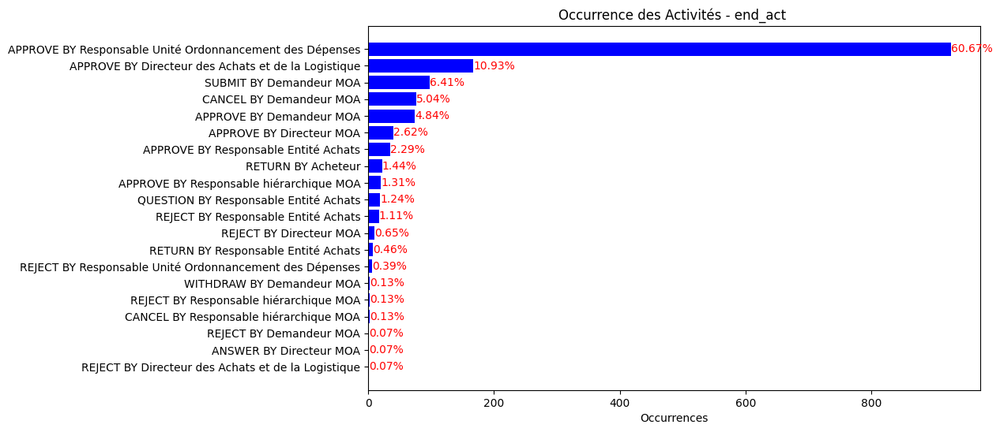

In [ ]:
import numpy as np
plot_activity_occurrence(start_activities, 'Occurrence des Activités - start-act ')
plot_activity_occurrence(end_activities, 'Occurrence des Activités - end_act ')

on remarque que pour start activities : 'SUBMIT BY Demandeur MOA': 1352, 'APPROVE BY Responsable Entité Achats': 42   represente plus que 90 %

et que pour end activities :'APPROVE BY Responsable Unité Ordonnancement des Dépenses': 927, 'APPROVE BY Directeur des Achats et de la Logistique': 167, 'SUBMIT BY Demandeur MOA': 98, 'CANCEL BY Demandeur MOA': 77, 'APPROVE BY Demandeur MOA': 74  represente plus que 90 %

In [ ]:
filtered_dataframe_by_start = pm4py.filter_start_activities(log, ['SUBMIT BY Demandeur MOA', 'APPROVE BY Responsable Entité Achats'], activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')

Donc apres filtrage par start activities on vas filtrer la filtered_dataframe par end activities

In [ ]:
filtered_dataframe_by_end = pm4py.filter_end_activities(filtered_dataframe_by_start, ['APPROVE BY Responsable Unité Ordonnancement des Dépenses', 'APPROVE BY Directeur des Achats et de la Logistique', 'CANCEL BY Demandeur MOA', 'APPROVE BY Demandeur MOA'], activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')


In [ ]:
log_variants = pm4py.get_variants(log, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')# varaints dans le log initiale
filtred_variants = pm4py.get_variants(filtered_dataframe_by_end, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')# varaints dans le log filtrer par start et end activities
print(len(filtred_variants),len(log_variants))

138 286


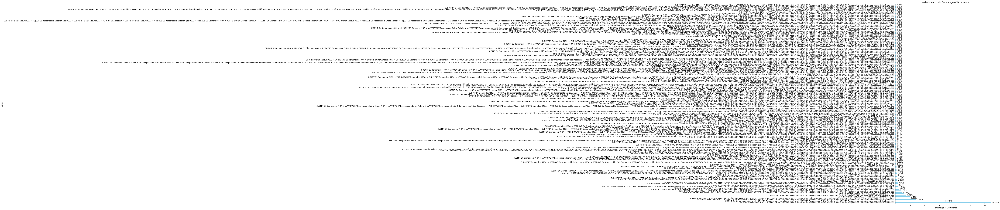

In [ ]:
import matplotlib.pyplot as plt

df_variants = pd.DataFrame(list(filtred_variants.items()), columns=['Variant', 'Count'])

# Calcule le pourcnetage d'occurence
total_cases = df_variants['Count'].sum()
df_variants['Sequence'] = df_variants['Variant'].apply(lambda x: ' -> '.join(x))
df_variants['Percentage'] = (df_variants['Count'] / total_cases) * 100

# Sort the DataFrame
df_variants = df_variants.sort_values(by='Count', ascending=False)


fig, ax = plt.subplots(figsize=(10, 20))
df_variants.plot(kind='barh', y='Percentage', x='Sequence', ax=ax, color='skyblue', legend=False)
ax.set_xlabel('Percentage of Occurrence')
ax.set_ylabel('Variant')
ax.set_title('Variants and their Percentage of Occurrence')

for p in ax.patches:
    ax.annotate(f'{p.get_width():.2f}%', (p.get_width(), p.get_y() + p.get_height() / 2.),
                ha='left', va='center', xytext=(5, 0), textcoords='offset points')

plt.show()

on'a reduit les variants a plus de 50 % ,on gardants les variants qui contient les start et end activites les plus frequents.

et on remarque dans le graphe apres un zoom qu'on peut ce base sur 35 variantes qui represente plus que 90 %

In [ ]:
def filter_variants_by_percentage(df_variants, min_percentage):
    """
    Filter variants based on a minimum percentage threshold.

    Parameters:
        df_variants (pd.DataFrame): DataFrame containing variants and their percentages.
        min_percentage (float): Minimum percentage threshold.

    Returns:
        pd.DataFrame: Filtered DataFrame containing variants with a total percentage
                      greater than or equal to the specified threshold.
    """
    df_variants_sorted = df_variants.sort_values(by='Percentage', ascending=False)

    # Initialiser la somme cumulative
    cumulative_sum = 0

    # Liste pour stocker les variants filtrés
    filtered_variants_list = []

    # Parcourir les variants triés
    for index, row in df_variants_sorted.iterrows():
        # Ajouter le pourcentage à la somme cumulative
        cumulative_sum += row['Percentage']

        # Ajouter la variante à la liste filtrée
        filtered_variants_list.append({'Variant': row['Variant'], 'Percentage': row['Percentage'],'Cumule':cumulative_sum})

        # Vérifier si la somme cumulative atteint ou dépasse la cible
        if cumulative_sum >= min_percentage:
            break

    # Créer un DataFrame à partir de la liste filtrée
    filtered_variants = pd.DataFrame(filtered_variants_list)

    return filtered_variants

# Exemple
df_variants_filtered = filter_variants_by_percentage(df_variants, 90)

df_variants_filtered

,Variant,Percentage,Cumule
0,"(SUBMIT BY Demandeur MOA, APPROVE BY Directeur...",32.151690,32.151690
1,"(SUBMIT BY Demandeur MOA, APPROVE BY Responsab...",16.488046,48.639736
2,"(SUBMIT BY Demandeur MOA, APPROVE BY Responsab...",7.007420,55.647156
3,"(SUBMIT BY Demandeur MOA, APPROVE BY Directeur...",5.028854,60.676010
4,"(SUBMIT BY Demandeur MOA, APPROVE BY Demandeur...",4.946414,65.622424
5,"(SUBMIT BY Demandeur MOA, APPROVE BY Responsab...",3.709810,69.332234
6,"(SUBMIT BY Demandeur MOA, CANCEL BY Demandeur ...",3.050289,72.382523
7,"(SUBMIT BY Demandeur MOA, APPROVE BY Responsab...",2.225886,74.608409
8,"(SUBMIT BY Demandeur MOA, WITHDRAW BY Demandeu...",1.978566,76.586974
9,"(SUBMIT BY Demandeur MOA, APPROVE BY Directeur...",1.154163,77.741138


In [ ]:
filtered_dataframe_by_variants = pm4py.filter_variants(filtered_dataframe_by_end,list(df_variants_filtered['Variant']), activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')

In [ ]:
efg=pm4py.discover_eventually_follows_graph(filtered_dataframe_by_variants, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
efg

c:\Users\ASUS\anaconda3\envs\IA_project\Lib\site-packages\pm4py\algo\discovery\dfg\adapters\pandas\df_statistics.py:212: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[start_timestamp_key] = df[timestamp_key]


{('APPROVE BY Demandeur MOA', 'APPROVE BY Demandeur MOA'): 4,
 ('APPROVE BY Demandeur MOA', 'APPROVE BY Responsable Entité Achats'): 5,
 ('APPROVE BY Demandeur MOA',
  'APPROVE BY Responsable Unité Ordonnancement des Dépenses'): 5,
 ('APPROVE BY Demandeur MOA', 'SUBMIT BY Demandeur MOA'): 4,
 ('APPROVE BY Demandeur MOA', 'WITHDRAW BY Demandeur MOA'): 4,
 ('APPROVE BY Directeur MOA', 'APPROVE BY Demandeur MOA'): 4,
 ('APPROVE BY Directeur MOA', 'APPROVE BY Directeur MOA'): 49,
 ('APPROVE BY Directeur MOA',
  'APPROVE BY Directeur des Achats et de la Logistique'): 114,
 ('APPROVE BY Directeur MOA', 'APPROVE BY Responsable Entité Achats'): 704,
 ('APPROVE BY Directeur MOA',
  'APPROVE BY Responsable Unité Ordonnancement des Dépenses'): 711,
 ('APPROVE BY Directeur MOA', 'APPROVE BY Responsable hiérarchique MOA'): 3,
 ('APPROVE BY Directeur MOA', 'CANCEL BY Demandeur MOA'): 18,
 ('APPROVE BY Directeur MOA', 'QUESTION BY Responsable Entité Achats'): 13,
 ('APPROVE BY Directeur MOA', 'SUBMIT

filtre par les efg

In [ ]:
def filter_efg_by_percentage(efg, min_percentage):
    """
    Filter efg based on a minimum percentage threshold.

    Parameters:
        df_efg (pd.DataFrame): DataFrame containing efg and their percentages.
        min_percentage (float): Minimum percentage threshold.

    Returns:
        pd.DataFrame: Filtered DataFrame containing efg with a total percentage
                      greater than or equal to the specified threshold.
    """
    efg=pm4py.discover_eventually_follows_graph(filtered_dataframe_by_variants, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp') # extraire les efg a partir de data filtre precedement
    df_efg = pd.DataFrame(list(efg.items()), columns=['efg', 'Count'])

    total_cases = df_efg['Count'].sum()
    df_efg['Sequence'] = df_efg['efg'].apply(lambda x: ' -> '.join(x))
    df_efg['Percentage'] = (df_efg['Count'] / total_cases) * 100

    df_efg_sorted = df_efg.sort_values(by='Percentage', ascending=False)

    # Initialiser la somme cumulative
    cumulative_sum = 0

    # Liste pour stocker les efg filtrés
    filtered_efg_list = []

    # Parcourir les efg triés
    for index, row in df_efg_sorted.iterrows():
        # Ajouter le pourcentage à la somme cumulative
        cumulative_sum += row['Percentage']

        # Ajouter la variante à la liste filtrée
        filtered_efg_list.append({'efg': row['efg'], 'Percentage': row['Percentage'],'Cumule':cumulative_sum})

        # Vérifier si la somme cumulative atteint ou dépasse la cible
        if cumulative_sum >= min_percentage:
            break

    # Créer un DataFrame à partir de la liste filtrée
    filtered_efg = pd.DataFrame(filtered_efg_list)

    return filtered_efg

# Exemple
df_efg_filtered = filter_efg_by_percentage(efg, 90)

df_efg_filtered

,efg,Percentage,Cumule
0,"(SUBMIT BY Demandeur MOA, APPROVE BY Responsab...",12.653937,12.653937
1,"(SUBMIT BY Demandeur MOA, APPROVE BY Responsab...",12.518360,25.172297
2,"(APPROVE BY Responsable Entité Achats, APPROVE...",11.411140,36.583437
3,"(SUBMIT BY Demandeur MOA, APPROVE BY Directeur...",9.072421,45.655858
4,"(APPROVE BY Directeur MOA, APPROVE BY Responsa...",8.032991,53.688849
5,"(APPROVE BY Directeur MOA, APPROVE BY Responsa...",7.953904,61.642752
6,"(SUBMIT BY Demandeur MOA, APPROVE BY Responsab...",5.084171,66.726924
7,"(APPROVE BY Responsable hiérarchique MOA, APPR...",4.801717,71.528641
8,"(APPROVE BY Responsable hiérarchique MOA, APPR...",4.745227,76.273867
9,"(SUBMIT BY Demandeur MOA, APPROVE BY Directeur...",1.683426,77.957293


In [ ]:
filtered_dataframe_by_efg = pm4py.filter_eventually_follows_relation(filtered_dataframe_by_variants, list(df_efg_filtered['efg']), activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')

In [ ]:
filtered_dataframe_by_efg

,NUM_DA,ACTION_CODE,USER,DATE ACTION,concept:name,time:timestamp,@@index,@@case_index,case:concept:name,start_timestamp
0,6468,SUBMIT,Demandeur MOA,2021-01-10 10:51:01+00:00,SUBMIT BY Demandeur MOA,2021-01-10 10:51:01+00:00,0,0,6468,2021-01-10 10:51:01+00:00
1,6468,APPROVE,Responsable hiérarchique MOA,2021-01-10 10:54:43+00:00,APPROVE BY Responsable hiérarchique MOA,2021-01-10 10:54:43+00:00,1,0,6468,2021-01-10 10:54:43+00:00
2,6468,APPROVE,Directeur MOA,2021-01-10 11:06:43+00:00,APPROVE BY Directeur MOA,2021-01-10 11:06:43+00:00,2,0,6468,2021-01-10 11:06:43+00:00
3,6468,APPROVE,Responsable Entité Achats,2021-01-10 11:43:35+00:00,APPROVE BY Responsable Entité Achats,2021-01-10 11:43:35+00:00,3,0,6468,2021-01-10 11:43:35+00:00
4,6468,APPROVE,Responsable Unité Ordonnancement des Dépenses,2021-01-10 14:42:44+00:00,APPROVE BY Responsable Unité Ordonnancement de...,2021-01-10 14:42:44+00:00,4,0,6468,2021-01-10 14:42:44+00:00
...,...,...,...,...,...,...,...,...,...,...
7356,8833,WITHDRAW,Demandeur MOA,2022-10-21 15:13:04+00:00,WITHDRAW BY Demandeur MOA,2022-10-21 15:13:04+00:00,7356,1527,8833,2022-10-21 15:13:04+00:00
7357,8833,SUBMIT,Demandeur MOA,2022-10-21 15:14:23+00:00,SUBMIT BY Demandeur MOA,2022-10-21 15:14:23+00:00,7357,1527,8833,2022-10-21 15:14:23+00:00
7358,8833,APPROVE,Directeur MOA,2022-10-21 15:47:55+00:00,APPROVE BY Directeur MOA,2022-10-21 15:47:55+00:00,7358,1527,8833,2022-10-21 15:47:55+00:00
7359,8833,APPROVE,Responsable Entité Achats,2022-10-21 15:52:36+00:00,APPROVE BY Responsable Entité Achats,2022-10-21 15:52:36+00:00,7359,1527,8833,2022-10-21 15:52:36+00:00


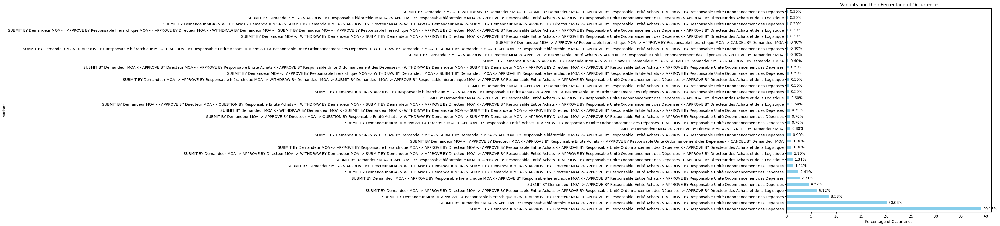

In [52]:
filtred_variants = pm4py.get_variants(filtered_dataframe_by_efg, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
df_variants = pd.DataFrame(list(filtred_variants.items()), columns=['Variant', 'Count'])

# Calcule le pourcnetage d'occurence
total_cases = df_variants['Count'].sum()
df_variants['Sequence'] = df_variants['Variant'].apply(lambda x: ' -> '.join(x))
df_variants['Percentage'] = (df_variants['Count'] / total_cases) * 100

# Sort the DataFrame
df_variants = df_variants.sort_values(by='Count', ascending=False)


fig, ax = plt.subplots(figsize=(10, 10))
df_variants.plot(kind='barh', y='Percentage', x='Sequence', ax=ax, color='skyblue', legend=False)
ax.set_xlabel('Percentage of Occurrence')
ax.set_ylabel('Variant')
ax.set_title('Variants and their Percentage of Occurrence')

for p in ax.patches:
    ax.annotate(f'{p.get_width():.2f}%', (p.get_width(), p.get_y() + p.get_height() / 2.),
                ha='left', va='center', xytext=(5, 0), textcoords='offset points')

plt.show()

c:\Users\ASUS\anaconda3\envs\IA_project\Lib\site-packages\pm4py\algo\discovery\dfg\adapters\pandas\df_statistics.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[start_timestamp_key] = df[timestamp_key]


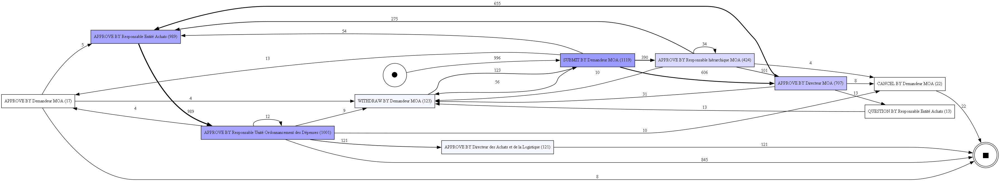

In [53]:
dfg,sm,fm=pm4py.discover_dfg(filtered_dataframe_by_efg,activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
pm4py.view_dfg(dfg,sm,fm)

c:\Users\ASUS\anaconda3\envs\IA_project\Lib\site-packages\pm4py\algo\discovery\dfg\adapters\pandas\df_statistics.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[start_timestamp_key] = df[timestamp_key]


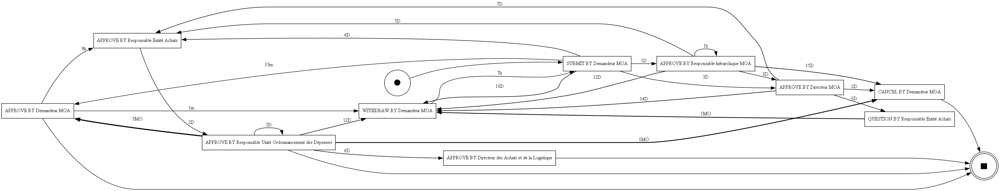

In [55]:
dfg_performance,sm,fm=pm4py.discover_performance_dfg(filtered_dataframe_by_efg,activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
pm4py.view_performance_dfg(dfg_performance,sm,fm)

c:\Users\ASUS\anaconda3\envs\IA_project\Lib\site-packages\pm4py\algo\discovery\dfg\adapters\pandas\df_statistics.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[start_timestamp_key] = df[timestamp_key]


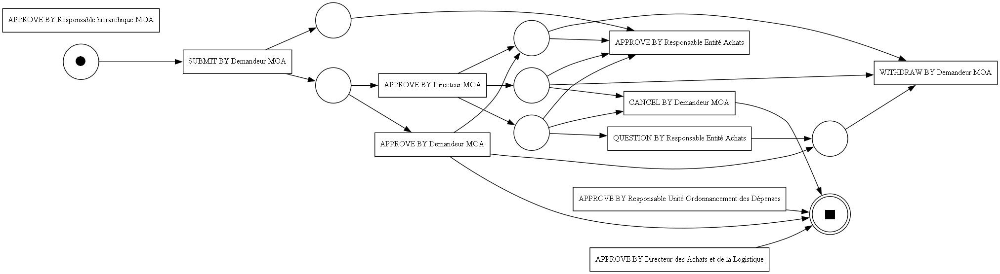

In [54]:
net,im,fm=pm4py.discover_petri_net_alpha(filtered_dataframe_by_efg,activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
pm4py.view_petri_net(net,im,fm)

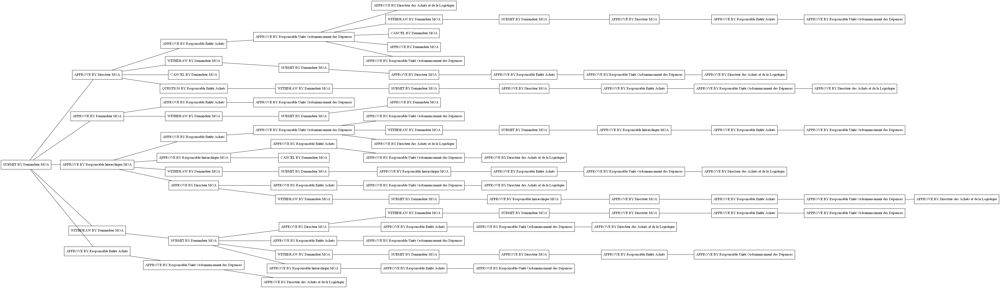

In [56]:
prefix_tree = pm4py.discover_prefix_tree(filtered_dataframe_by_efg, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
pm4py.view_prefix_tree(prefix_tree, format='png')

c:\Users\ASUS\anaconda3\envs\IA_project\Lib\site-packages\pm4py\algo\discovery\dfg\adapters\pandas\df_statistics.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[start_timestamp_key] = df[timestamp_key]
c:\Users\ASUS\anaconda3\envs\IA_project\Lib\site-packages\pm4py\algo\discovery\dfg\adapters\pandas\df_statistics.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[start_timestamp_key] = df[timestamp_key]


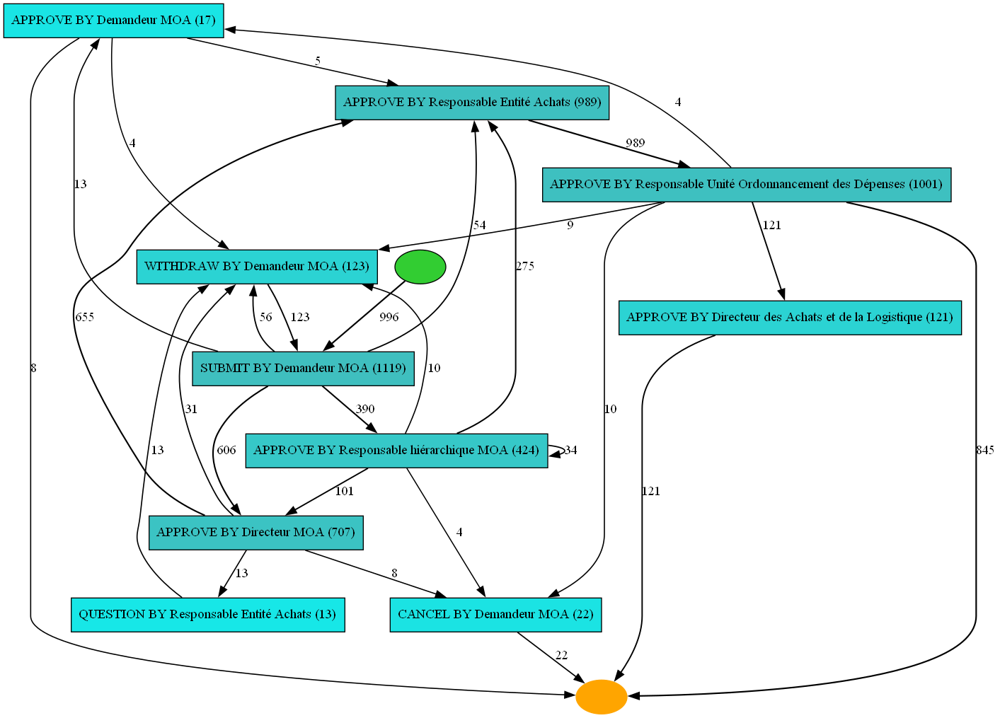

In [57]:
heu_net = pm4py.discover_heuristics_net(filtered_dataframe_by_efg, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
pm4py.view_heuristics_net(heu_net, format='png')

aligning log, completed variants ::   0%|          | 0/286 [00:00<?, ?it/s]

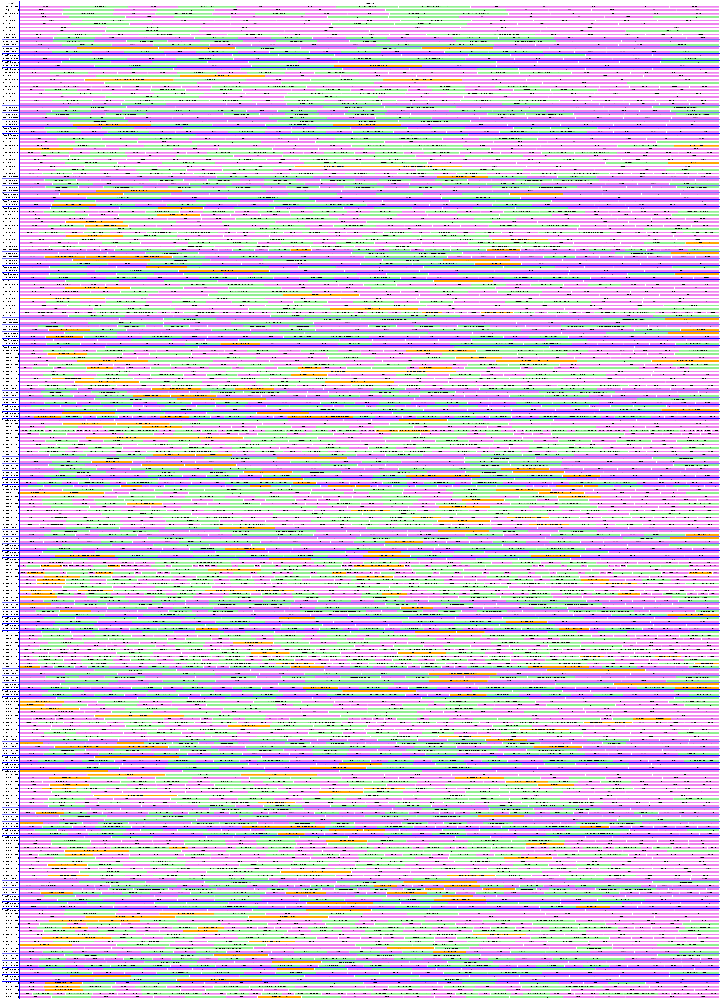

In [58]:
net, im, fm = pm4py.discover_petri_net_inductive(filtered_dataframe_by_efg)
aligned_traces = pm4py.conformance_diagnostics_alignments(log, net, im, fm)
pm4py.view_alignments(log, aligned_traces, format='png')

3151.847513089005


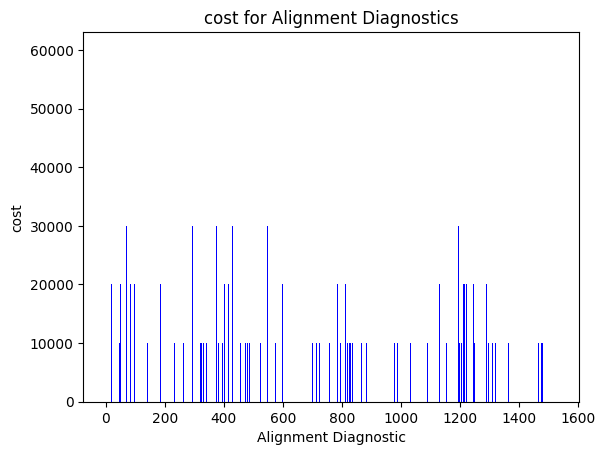

20.521596858638745


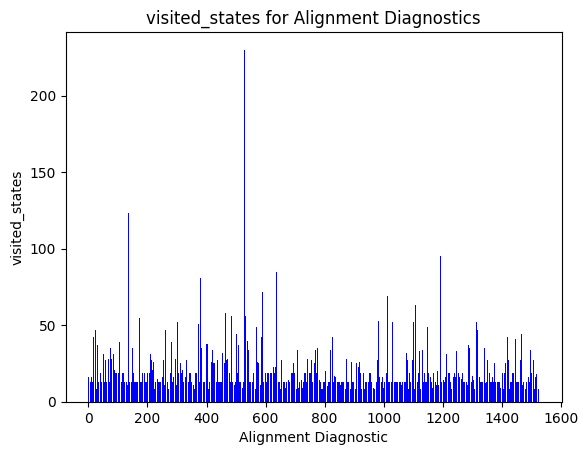

61.31151832460733


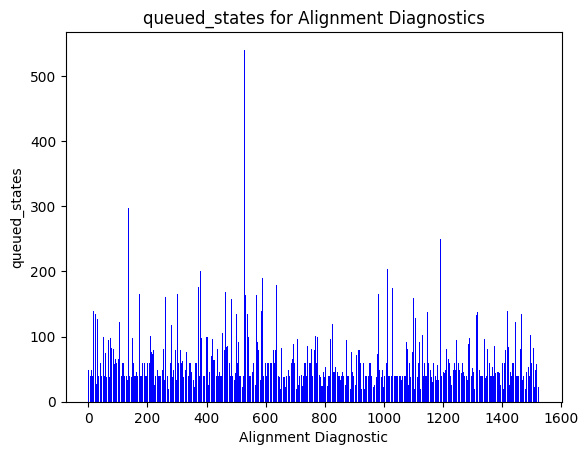

63.22120418848168


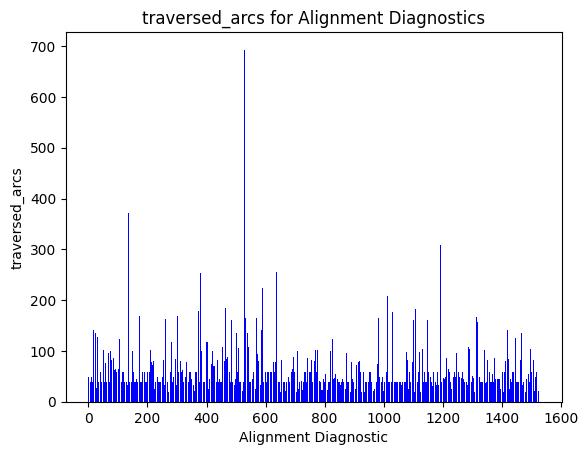

8.854712041884817


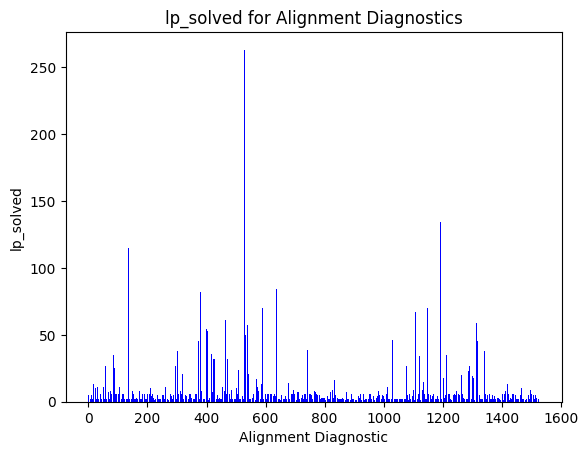

0.9541355122543945


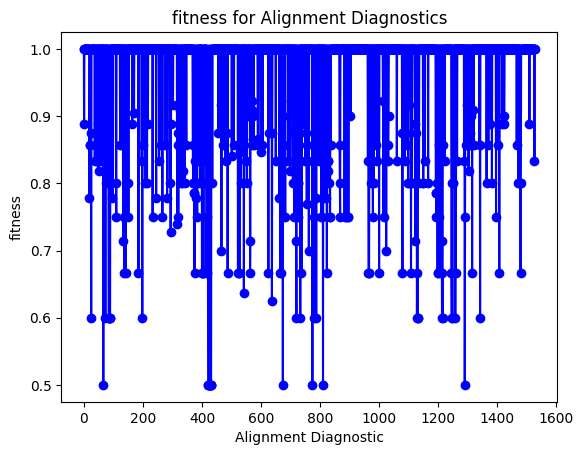

In [61]:
variables = ['cost', 'visited_states', 'queued_states', 'traversed_arcs', 'lp_solved', 'fitness']

# Créer des graphiques en barres pour chaque variable
for variable in variables:
    values = [diag[variable] for diag in aligned_traces]
    print(np.mean(values))
    fig, ax = plt.subplots()

    if variable in ['cost', 'visited_states', 'queued_states', 'traversed_arcs', 'lp_solved']:
        # Utilisez un graphique en barres pour les variables quantitatives
        ax.bar(range(len(aligned_traces)), values, color='b')
    else:
        # Utilisez un graphique linéaire pour la variable fitness
        ax.plot(range(len(aligned_traces)), values, marker='o', linestyle='-', color='b')

    plt.xlabel('Alignment Diagnostic')
    plt.ylabel(variable)
    plt.title(f'{variable} for Alignment Diagnostics')
    plt.show()

la moyenne de fitness de modele avec le log est 95.41 % 

In [62]:
net, im, fm = pm4py.discover_petri_net_inductive(filtered_dataframe_by_efg, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
tbr_diagnostics = pm4py.conformance_diagnostics_token_based_replay(log, net, im, fm, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')

replaying log with TBR, completed variants ::   0%|          | 0/286 [00:00<?, ?it/s]

In [63]:
tbr_diagnostics

[{'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(tau_1, None),
   (b4e632fd-0e69-4b2e-acdd-91febe3c28aa, 'SUBMIT BY Demandeur MOA'),
   (init_loop_5, None),
   (8390ce03-de91-41bc-b93c-3d074a0b8f38, 'APPROVE BY Responsable hiérarchique MOA'),
   (skip_8, None),
   (ac7318f1-f88b-4cf9-915f-945b65227d80, 'APPROVE BY Directeur MOA'),
   (tauSplit_11, None),
   (fdda838c-718d-47e5-972d-925955bc7150, 'APPROVE BY Responsable Entité Achats'),
   (216d7d8c-f9bd-4f0b-9cc5-a26a0ea5f110, 'APPROVE BY Responsable Unité Ordonnancement des Dépenses'),
   (skip_13, None),
   (skip_18, None),
   (tauJoin_12, None),
   (skip_19, None),
   (skip_21, None),
   (skip_22, None)],
  'reached_marking': ['sink:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 17,
  'remaining_tokens': 0,
  'produced_tokens': 17},
 {'trace_is_fit': False,
  'trace_fitness': 0.9365942028985508,
  'activated_transitions': [(ta

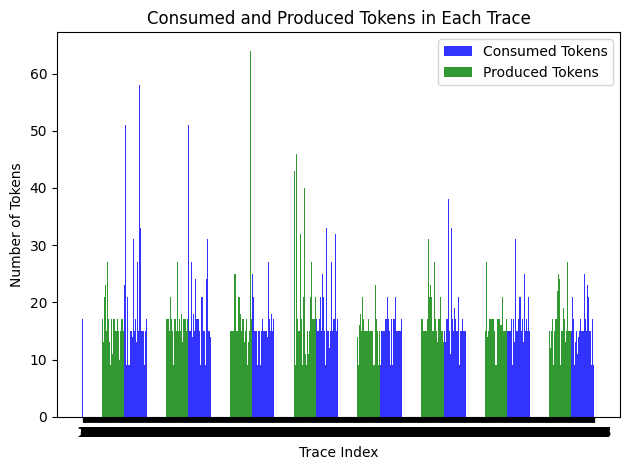

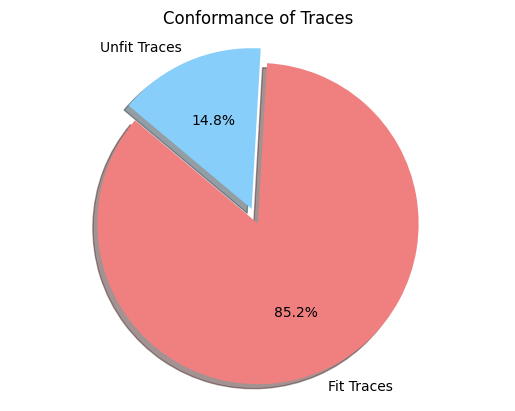

In [64]:
import numpy as np
trace_indices = np.arange(len(tbr_diagnostics))
consumed_tokens = [diag['consumed_tokens'] for diag in tbr_diagnostics]
produced_tokens = [diag['produced_tokens'] for diag in tbr_diagnostics]

fig, ax = plt.subplots()
bar_width = 0.35
opacity = 0.8

rects1 = plt.bar(trace_indices, consumed_tokens, bar_width, alpha=opacity, color='b', label='Consumed Tokens')
rects2 = plt.bar(trace_indices + bar_width, produced_tokens, bar_width, alpha=opacity, color='g', label='Produced Tokens')

plt.xlabel('Trace Index')
plt.ylabel('Number of Tokens')
plt.title('Consumed and Produced Tokens in Each Trace')
plt.xticks(trace_indices + bar_width, range(1, len(tbr_diagnostics) + 1))
plt.legend()

plt.tight_layout()
plt.show()

# Diagramme en secteurs pour la conformité des traces
fit_trace_count = sum([1 for diag in tbr_diagnostics if diag['trace_is_fit']])
unfit_trace_count = len(tbr_diagnostics) - fit_trace_count

labels = ['Fit Traces', 'Unfit Traces']
sizes = [fit_trace_count, unfit_trace_count]
colors = ['lightcoral', 'lightskyblue']
explode = (0.1, 0)

plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')
plt.title('Conformance of Traces')
plt.show()

on'a une fitness des traces de 85.2 %

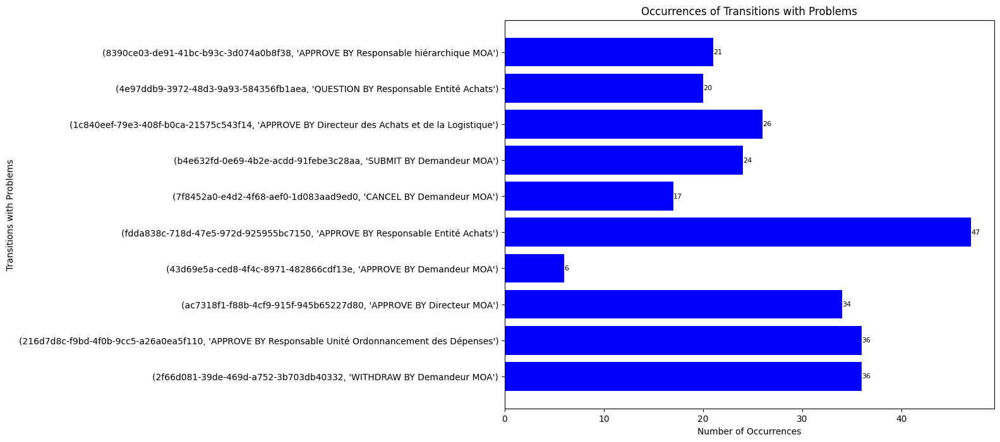

In [73]:
from collections import Counter

# Collecte des transitions avec problèmes de tous les diagnostics
all_transitions_with_problems = [transition for diag in tbr_diagnostics if not diag['trace_is_fit']
                                  for transition in diag['transitions_with_problems']]

# Comptage du nombre d'occurrences de chaque transition avec problèmes
transition_counts = Counter(all_transitions_with_problems)

# Convert tuples to strings
transitions = [str(transition) for transition in transition_counts.keys()]
occurrences = list(transition_counts.values())

fig, ax = plt.subplots(figsize=(10, 8))
bars = ax.barh(transitions, occurrences, color='b')

plt.xlabel('Number of Occurrences')
plt.ylabel('Transitions with Problems')
plt.title('Occurrences of Transitions with Problems')

for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{bar.get_width()}', 
             va='center', ha='left', fontsize=8)

plt.show()


In [75]:
net, im, fm = pm4py.discover_petri_net_inductive(filtered_dataframe_by_efg, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
fitness_tbr = pm4py.fitness_token_based_replay(log, net, im, fm, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
fitness_tbr

replaying log with TBR, completed variants ::   0%|          | 0/286 [00:00<?, ?it/s]

{'perc_fit_traces': 85.20942408376963,
 'average_trace_fitness': 0.9863344607110837,
 'log_fitness': 0.9875979717219248,
 'percentage_of_fitting_traces': 85.20942408376963}

Explication:

Le diagnostic de "Replay Fitness" basé sur les jetons utilise le concept de "token-based replay", où chaque trace est comparée avec le modèle de réseau de Petri associé. Le processus consiste à simuler l'exécution de chaque trace dans le modèle, en suivant les transitions du modèle et en vérifiant les jetons dans les places.

perc_fit_traces : Le pourcentage de traces qui correspondent entièrement au modèle. Dans le cas où chaque trace s'aligne parfaitement avec le modèle, ce pourcentage serait de 100%.

average_trace_fitness : La fitness moyenne de toutes les traces. La fitness d'une trace individuelle est une mesure de la conformité de cette trace par rapport au modèle.

log_fitness : La fitness du journal d'événements dans son ensemble. C'est une mesure agrégée qui prend en compte la conformité de toutes les traces dans le journal.

percentage_of_fitting_traces : Le pourcentage de traces qui correspondent au modèle. C'est une autre manière de représenter la conformité globale du journal d'événements par rapport au modèle.


In [76]:
net, im, fm = pm4py.discover_petri_net_inductive(filtered_dataframe_by_efg, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
fitness_alignments = pm4py.fitness_alignments(log, net, im, fm, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
fitness_alignments

aligning log, completed variants ::   0%|          | 0/286 [00:00<?, ?it/s]

{'percFitTraces': 79.51570680628272,
 'averageFitness': 0.9541355122543945,
 'percentage_of_fitting_traces': 79.51570680628272,
 'average_trace_fitness': 0.9541355122543945,
 'log_fitness': 0.9458269370579506}

Explication :

Le diagnostic de "Fitness Alignments" est basé sur l'alignement, une technique qui vise à trouver l'alignement optimal entre une trace et le modèle. Cela signifie associer chaque événement de la trace à une transition du modèle ou à un événement fictif (»). Les différents types de mouvements dans l'alignement incluent les mouvements synchrones, les mouvements sur le journal (non mimés dans le modèle), et les mouvements sur le modèle (non mimés dans le journal).

percFitTraces : Le pourcentage de traces qui correspondent complètement au modèle. Dans le cas où chaque trace s'aligne parfaitement avec le modèle, ce pourcentage serait de 100%.

averageFitness : La fitness moyenne de toutes les traces. La fitness d'une trace individuelle est une mesure de la conformité de cette trace par rapport au modèle.

percentage_of_fitting_traces : Le pourcentage de traces qui correspondent au modèle. C'est une autre manière de représenter la conformité globale du journal d'événements par rapport au modèle.

average_trace_fitness : La fitness moyenne des traces individuelles. C'est une mesure similaire à averageFitness, mais fournit plus de détails sur les performances moyennes de chaque trace.

log_fitness : La fitness globale du journal d'événements est calculée comme la moyenne des fitness individuelles de chaque trace.

In [77]:
temporal_profile = pm4py.discover_temporal_profile(filtered_dataframe_by_efg, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
conformance_temporal_profile = pm4py.conformance_temporal_profile(log, temporal_profile, zeta=1, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
conformance_temporal_profile

[[],
 [('SUBMIT BY Demandeur MOA',
   'APPROVE BY Directeur MOA',
   7952268.0,
   3.2827951833991533),
  ('SUBMIT BY Demandeur MOA',
   'APPROVE BY Directeur MOA',
   8280053.0,
   3.4283887983773136),
  ('SUBMIT BY Demandeur MOA',
   'APPROVE BY Responsable Entité Achats',
   7953451.0,
   2.537101182062359),
  ('SUBMIT BY Demandeur MOA',
   'APPROVE BY Responsable Entité Achats',
   8280256.0,
   2.6569516305704646),
  ('SUBMIT BY Demandeur MOA',
   'APPROVE BY Responsable Unité Ordonnancement des Dépenses',
   8281432.0,
   2.366810946363365),
  ('SUBMIT BY Demandeur MOA',
   'WITHDRAW BY Demandeur MOA',
   8015766.0,
   1.5144735463239656),
  ('SUBMIT BY Demandeur MOA',
   'SUBMIT BY Demandeur MOA',
   8015813.0,
   1.5044470316792182),
  ('APPROVE BY Responsable Entité Achats',
   'WITHDRAW BY Demandeur MOA',
   62315.0,
   1.0034271672829995),
  ('APPROVE BY Responsable Entité Achats',
   'SUBMIT BY Demandeur MOA',
   62362.0,
   1.0034099969946026)],
 [],
 [],
 [('SUBMIT BY Dem

In [78]:
declare_model = pm4py.discover_declare(filtered_dataframe_by_efg)
conf_result = pm4py.conformance_declare(log, declare_model)
conf_result

c:\Users\ASUS\anaconda3\envs\IA_project\Lib\site-packages\pm4py\algo\discovery\declare\variants\classic.py:397: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  dataframe[__rule_succession(act, act2)] = dataframe[
c:\Users\ASUS\anaconda3\envs\IA_project\Lib\site-packages\pm4py\algo\discovery\declare\variants\classic.py:397: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  dataframe[__rule_succession(act, act2)] = dataframe[
c:\Users\ASUS\anaconda3\envs\IA_project\Lib\site-packages\pm4py\algo\discovery\declare\variants\classic.py:397: 

[{'no_constr_total': 45,
  'deviations': [],
  'no_dev_total': 0,
  'dev_fitness': 1.0,
  'is_fit': True},
 {'no_constr_total': 45,
  'deviations': [['exactly_one', 'SUBMIT BY Demandeur MOA'],
   ['exactly_one', 'APPROVE BY Responsable Entité Achats'],
   ['altresponse',
    ('SUBMIT BY Demandeur MOA',
     'APPROVE BY Responsable Unité Ordonnancement des Dépenses')],
   ['altresponse',
    ('APPROVE BY Responsable Entité Achats',
     'APPROVE BY Responsable Unité Ordonnancement des Dépenses')],
   ['chainresponse',
    ('APPROVE BY Responsable Entité Achats',
     'APPROVE BY Responsable Unité Ordonnancement des Dépenses')],
   ['altsuccession',
    ('SUBMIT BY Demandeur MOA',
     'APPROVE BY Responsable Unité Ordonnancement des Dépenses')],
   ['altsuccession',
    ('APPROVE BY Responsable Entité Achats',
     'APPROVE BY Responsable Unité Ordonnancement des Dépenses')],
   ['chainsuccession',
    ('APPROVE BY Responsable Entité Achats',
     'APPROVE BY Responsable Unité Ordonnanc

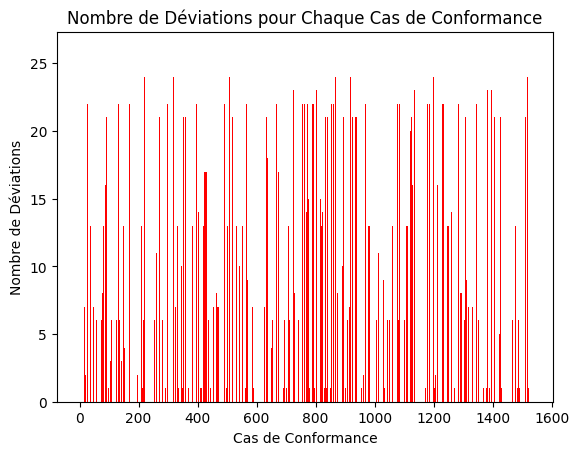

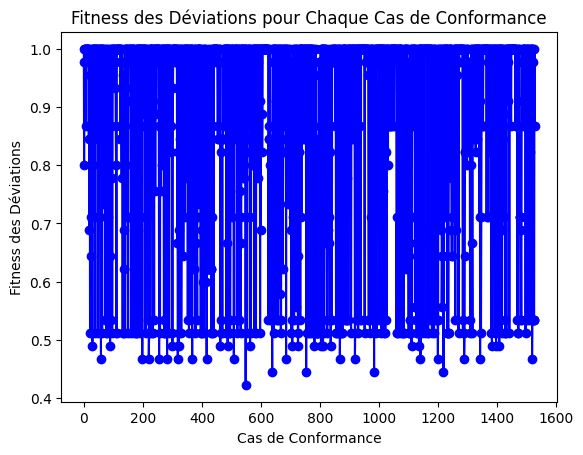

In [79]:
deviations_count = [result['no_dev_total'] for result in conf_result]
dev_fitness_values = [result['dev_fitness'] for result in conf_result]

# Créer un graphique en barres pour le nombre de déviations
plt.bar(range(len(conf_result)), deviations_count, color='red')
plt.xlabel('Cas de Conformance')
plt.ylabel('Nombre de Déviations')
plt.title('Nombre de Déviations pour Chaque Cas de Conformance')
plt.show()

# Créer un graphique linéaire pour la fitness des déviations
indices = np.arange(len(conf_result))

# espacement_personnalise = 0

# Créer un graphique linéaire avec un espacement entre les points sur l'axe X
plt.plot(indices, dev_fitness_values, marker='o', linestyle='-', color='blue')
plt.xlabel('Cas de Conformance')
plt.ylabel('Fitness des Déviations')
plt.title('Fitness des Déviations pour Chaque Cas de Conformance')
# plt.xticks(indices * (1 + espacement_personnalise), range(1, len(conf_result) + 1))  # Ajouter un espacement
plt.show()

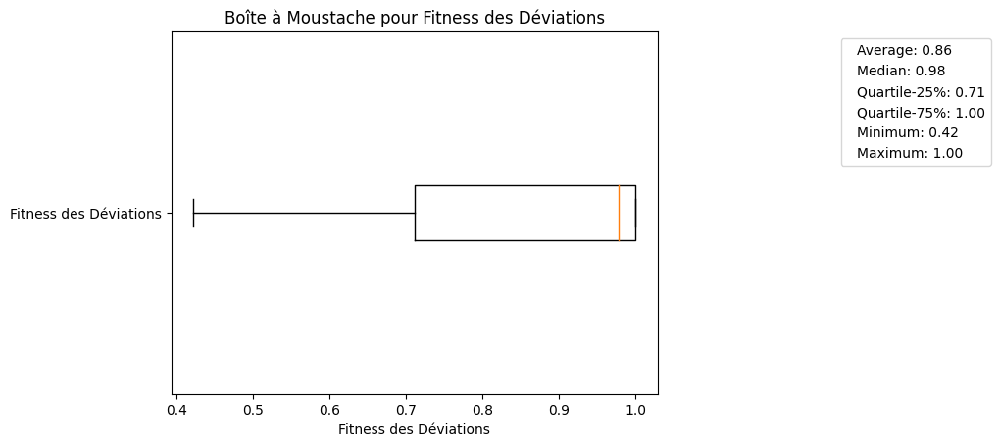

In [83]:
dev_fitness_values_list = [result['dev_fitness'] for result in conf_result]

# Create a boxplot
plt.boxplot(dev_fitness_values_list, vert=False, labels=['Fitness des Déviations'])

average = np.mean(dev_fitness_values_list) 
median = np.median(dev_fitness_values_list) 
q25 = np.percentile(dev_fitness_values_list, 25) 
q75 = np.percentile(dev_fitness_values_list, 75) 
minimum = np.min(dev_fitness_values_list) 
maximum = np.max(dev_fitness_values_list) 


legend_labels = [
        f'Average: {average:.2f}',
        f'Median: {median:.2f}',
        f'Quartile-25%: {q25:.2f}',
        f'Quartile-75%: {q75:.2f}',
        f'Minimum: {minimum:.2f}',
        f'Maximum: {maximum:.2f}'
    ]

plt.legend(legend_labels, loc='upper right', bbox_to_anchor=(1.7, 1), handlelength=0)

plt.xlabel('Fitness des Déviations')
plt.title('Boîte à Moustache pour Fitness des Déviations')
plt.show()

Apres le conformance checking qui a donne des bons resutas , on peut dire que le modele finale combine la simplicite , la generalisation , la precision et le fitness avec le log initiale .  

 ## BPMN extrait apres les analyses et les filtres necessaires 

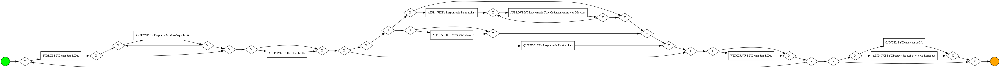

In [88]:
bpmn_graph = pm4py.discover_bpmn_inductive(filtered_dataframe_by_efg, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
pm4py.view_bpmn(bpmn_graph)

## BMPN donnees par CDG 


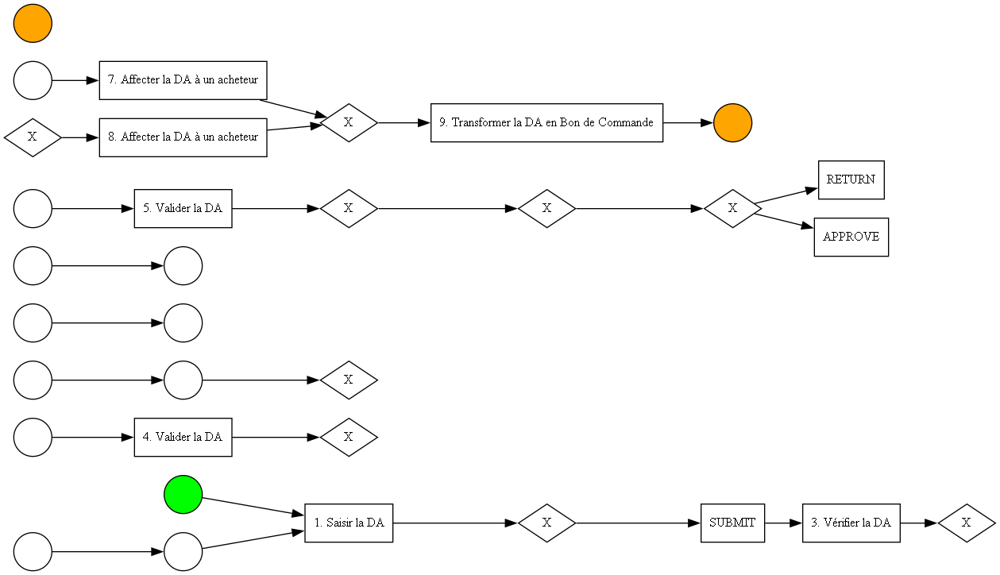

In [89]:
bpmn=pm4py.read_bpmn('cdg_bpmn (1).bpmn')
pm4py.view_bpmn(bpmn)

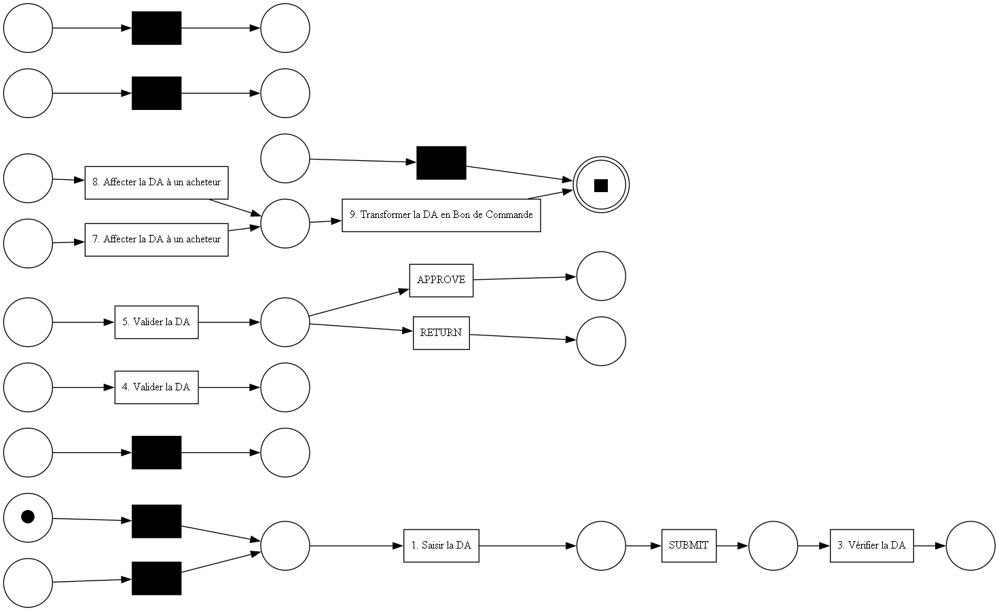

In [90]:
net,im,fm=pm4py.convert_to_petri_net(bpmn)
pm4py.view_petri_net(net, im, fm)